In [ ]:
#  Install library
!pip install -q transformers datasets accelerate peft torch torchvision torchaudio
!pip install -q openpyxl
!pip install -q lime shap
!pip install -q evaluate


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.3 MB/s eta 0:00:00


# Preprocessing

Load dataset

In [ ]:
import pandas as pd
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from transformers import AutoTokenizer

# === LOAD DATASET ===
df = pd.read_excel("/content/Dataset ML.xlsx")

# Ambil kolom yang benar
df = df[['2', 4]]
df.columns = ['text', 'label']


In [ ]:
df = df.dropna(subset=['text', 'label'])

In [ ]:
def clean_text(text):
    text = str(text).lower()                                 # lowercase
    text = re.sub(r"http\S+|www\S+", "", text)              # hapus URL
    text = re.sub(r"@\w+", "", text)                        # hapus mention
    text = re.sub(r"#\w+", "", text)                        # hapus hashtag
    text = emoji.replace_emoji(text, replace="")            # hapus emoji
    text = re.sub(r"[^a-zA-Z0-9\s]", " ", text)             # hapus karakter aneh
    text = re.sub(r"\s+", " ", text).strip()                # normalisasi spasi
    return text

Encoding

In [ ]:
le = LabelEncoder()
df['label_enc'] = le.fit_transform(df['label'])

Split

In [ ]:
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['label_enc'])

train_df.to_csv("train.csv", index=False)
test_df.to_csv("test.csv", index=False)

Tokenizer

In [ ]:
model_name = "indobenchmark/indobert-base-p1"
tokenizer = AutoTokenizer.from_pretrained(model_name)

train_df.head()

,text,label,label_enc
1200,Saya prnh gangguwan jiwa tpi saya tuangkan ket...,bahagia,0
877,Jadi mental illnes itu sulit disembuhkan ya,sedih,5
1032,"Cedera mental sejak kecil<br>umur 6 tahun, say...",sedih,5
1274,Kenapa sih mbaknya cantik cantik tapi masih mi...,kecewa,2
929,Saya semenjak corona gak berani ke psikiater k...,sedih,5


# EDA

In [ ]:
df.info()
df.isnull().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       1500 non-null   object
 1   label      1500 non-null   object
 2   label_enc  1500 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 35.3+ KB


,0
text,0
label,0
label_enc,0


In [ ]:
df['label'].value_counts()

,count
label,
sedih,512
empati,311
netral,307
bahagia,188
kecewa,91
other,91


In [ ]:
df['text_length'] = df['text'].astype(str).apply(len)

print("\n📏 Statistik panjang teks:")
print(df['text_length'].describe())


📏 Statistik panjang teks:
count    1500.000000
mean      170.124000
std       270.161903
min         1.000000
25%        32.000000
50%        84.000000
75%       190.250000
max      2622.000000
Name: text_length, dtype: float64


# LoRa + IndoBERT

In [ ]:
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer, AutoTokenizer
from datasets import Dataset
from peft import LoraConfig, get_peft_model

# ======== FIX PENTING: pastikan 'text' benar-benar string ========
train_df["text"] = train_df["text"].astype(str)
test_df["text"] = test_df["text"].astype(str)

train_df = train_df.dropna(subset=["text"])
test_df = test_df.dropna(subset=["text"])

# Convert ke Dataset HuggingFace
train_dataset = Dataset.from_pandas(train_df)
test_dataset = Dataset.from_pandas(test_df)

# Tokenizer
tokenizer = AutoTokenizer.from_pretrained("indobenchmark/indobert-base-p1")

def tokenize(batch):
    return tokenizer(
        batch['text'],
        padding="max_length",
        truncation=True,
        max_length=128
    )

train_dataset = train_dataset.map(tokenize, batched=True)
test_dataset  = test_dataset.map(tokenize, batched=True)

# Rename kolom label
train_dataset = train_dataset.rename_column("label_enc", "labels")
test_dataset  = test_dataset.rename_column("label_enc", "labels")

# Drop kolom yang tidak diperlukan oleh Trainer
train_dataset = train_dataset.remove_columns(
    [col for col in train_dataset.column_names if col not in ["input_ids","attention_mask","labels"]]
)
test_dataset = test_dataset.remove_columns(
    [col for col in test_dataset.column_names if col not in ["input_ids","attention_mask","labels"]]
)

# Format ke torch
cols = ['input_ids', 'attention_mask', 'labels']
train_dataset.set_format(type='torch', columns=cols)
test_dataset.set_format(type='torch', columns=cols)

# =======================
#      LOAD BASE MODEL
# =======================
base_model = AutoModelForSequenceClassification.from_pretrained(
    "indobenchmark/indobert-base-p1",
    num_labels=len(df['label'].unique())
)

# =======================
#      KONFIG LORA
# =======================
lora_config = LoraConfig(
    r=8,
    lora_alpha=16,
    lora_dropout=0.1,
    bias="none",
    task_type="SEQ_CLS"
)

model = get_peft_model(base_model, lora_config)
model.print_trainable_parameters()

# =======================
#      TRAINING
# =======================
import os
os.environ["WANDB_DISABLED"] = "true"

training_args = TrainingArguments(
    output_dir="./results_lora",
    eval_strategy="epoch",
    save_strategy="epoch",
    learning_rate=2e-4,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=4,
    weight_decay=0.01,
)



trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

trainer.train()
trainer.save_model("indobert-lora-emotion")


Map:   0%|          | 0/1200 [00:00<?, ? examples/s]

Map:   0%|          | 0/300 [00:00<?, ? examples/s]

pytorch_model.bin:   0%|          | 0.00/498M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indobenchmark/indobert-base-p1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Using the `WANDB_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


trainable params: 299,526 || all params: 124,745,484 || trainable%: 0.2401


model.safetensors:   0%|          | 0.00/498M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Epoch,Training Loss,Validation Loss
1,No log,1.429584
2,No log,1.210563
3,No log,1.154925
4,No log,1.146368


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Evaluasi Model

In [ ]:
predictions = trainer.predict(test_dataset)
import numpy as np
from sklearn.metrics import classification_report

y_pred = np.argmax(predictions.predictions, axis=1)
y_true = predictions.label_ids

print(classification_report(y_true, y_pred, target_names=le.classes_))


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


              precision    recall  f1-score   support

     bahagia       0.65      0.45      0.53        38
      empati       0.64      0.56      0.60        62
      kecewa       0.00      0.00      0.00        18
      netral       0.56      0.66      0.61        61
       other       1.00      0.22      0.36        18
       sedih       0.63      0.88      0.74       103

    accuracy                           0.62       300
   macro avg       0.58      0.46      0.47       300
weighted avg       0.61      0.62      0.59       300



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


# XAI: LIME dan SHAP

## VERSI RIBET

Installing required packages...

✓ Installation complete!

✓ All packages imported!

SECTION 2: LOADING DATA & MODEL

[1/4] Loading dataset...
  Cleaning data...
  Train size: 1089
  Test size: 270
  ✓ Data cleaned (removed texts with < 2 words)

[2/4] Setting up label encoder...
  Emotion classes: ['bahagia', 'empati', 'kecewa', 'netral', 'other', 'sedih']
  Number of classes: 6

[3/4] Device: cpu

[4/4] Loading trained model...


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at indobenchmark/indobert-base-p1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  ✓ Model loaded successfully!
  Model parameters: 124,745,484

SECTION 3: SETTING UP PREDICTION FUNCTIONS
✓ Prediction functions ready!

Test prediction:
  Text: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terba...
  Predicted: sedih (0.774)

SECTION 4: MODEL EVALUATION ON TEST SET

Evaluating model on test set...

Classification Report:
              precision    recall  f1-score   support

     bahagia       0.80      0.50      0.62        32
      empati       0.63      0.64      0.63        58
      kecewa       0.00      0.00      0.00        18
      netral       0.67      0.71      0.69        58
       other       0.00      0.00      0.00         8
       sedih       0.66      0.89      0.76        96

    accuracy                           0.66       270
   macro avg       0.46      0.46      0.45       270
weighted avg       0.61      0.66      0.63       270



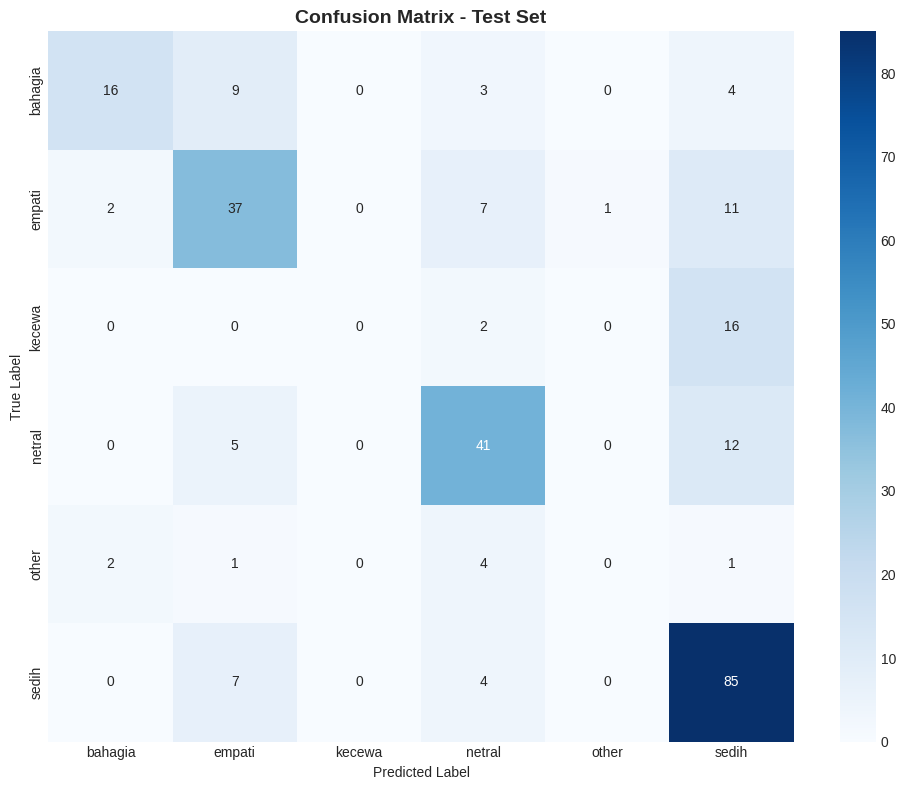

✓ Confusion matrix saved as 'confusion_matrix.png'

SECTION 5: LIME (Local Interpretable Model-agnostic Explanations)
✓ LIME explainer initialized

----------------------------------------------------------------------
EXAMPLE ANALYSES
----------------------------------------------------------------------

LIME EXAMPLE 1

Explaining: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya meman...
Predicted: sedih (confidence: 0.774)
Computing LIME explanation with 500 samples...

Top 10 contributing features:
--------------------------------------------------
gk                        -0.1689 ███
sepantasnya               -0.0998 █
bahagia                   + 0.0684 █
terbayang                 -0.0617 █
Kamu                      + 0.0548 █
selalu                    + 0.0455 
itu                       + 0.0252 
Jadi                      -0.0199 
aku                       + 0.0176 
seharusnya                -0.0171 

✓ Interactive HTML saved: lime_example_1.html
✓ Ima


LIME EXAMPLE 2

Explaining: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama n...
Predicted: empati (confidence: 0.702)
Computing LIME explanation with 500 samples...

Top 10 contributing features:
--------------------------------------------------
kalian                    + 0.2445 ████
semangat                  + 0.1478 ██
skizofrenia               -0.0866 █
berjuang                  + 0.0719 █
sembuh                    + 0.0475 
ya                        + 0.0456 
untuk                     + 0.0431 
saya                      -0.0353 
pasti                     + 0.0299 
hampir                    -0.0280 

✓ Interactive HTML saved: lime_example_2.html
✓ Image saved: lime_example_2.png



LIME EXAMPLE 3

Explaining: Aku juga bipolar alhamdulilah udah minum obat 3 bulan moodnya semakin membaik ta...
Predicted: sedih (confidence: 0.777)
Computing LIME explanation with 500 samples...

Top 10 contributing features:
--------------------------------------------------
bipolar                   -0.0194 
alhamdulilah              + 0.0187 
belum                     -0.0109 
mikir                     -0.0099 
tapi                      -0.0085 
aku                       -0.0073 
bisa                      + 0.0073 
membaik                   + 0.0069 
kaya                      -0.0063 
semakin                   + 0.0048 

✓ Interactive HTML saved: lime_example_3.html
✓ Image saved: lime_example_3.png



SECTION 6: ATTENTION WEIGHT VISUALIZATION

----------------------------------------------------------------------
ATTENTION VISUALIZATION EXAMPLES
----------------------------------------------------------------------

ATTENTION EXAMPLE 1

Visualizing attention: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya meman...


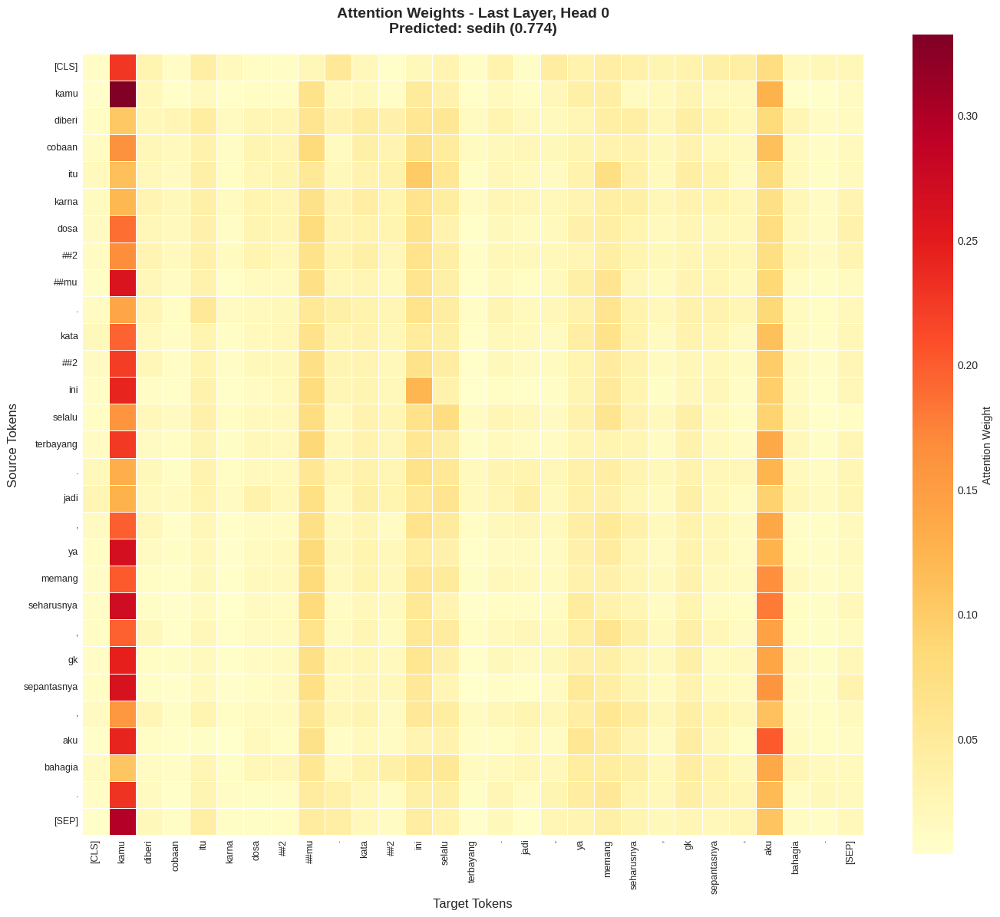

✓ Saved: attention_heatmap_1.png

Token importance: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya meman...


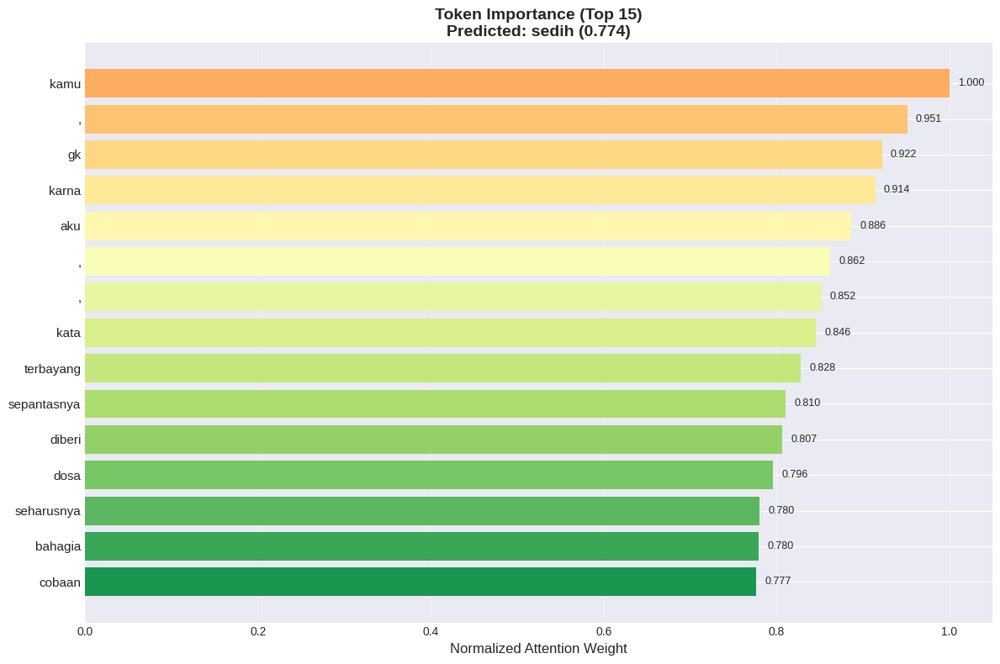

✓ Saved: token_importance_1.png

ATTENTION EXAMPLE 2

Visualizing attention: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama n...


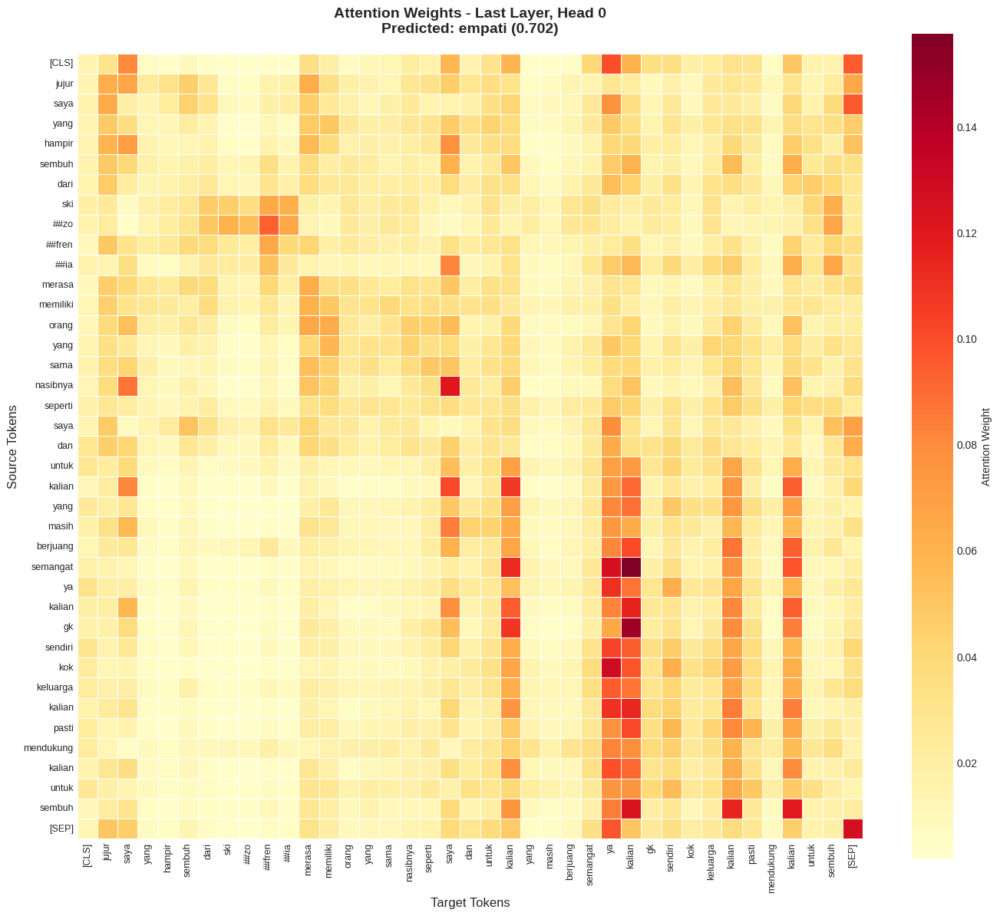

✓ Saved: attention_heatmap_2.png

Token importance: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama n...


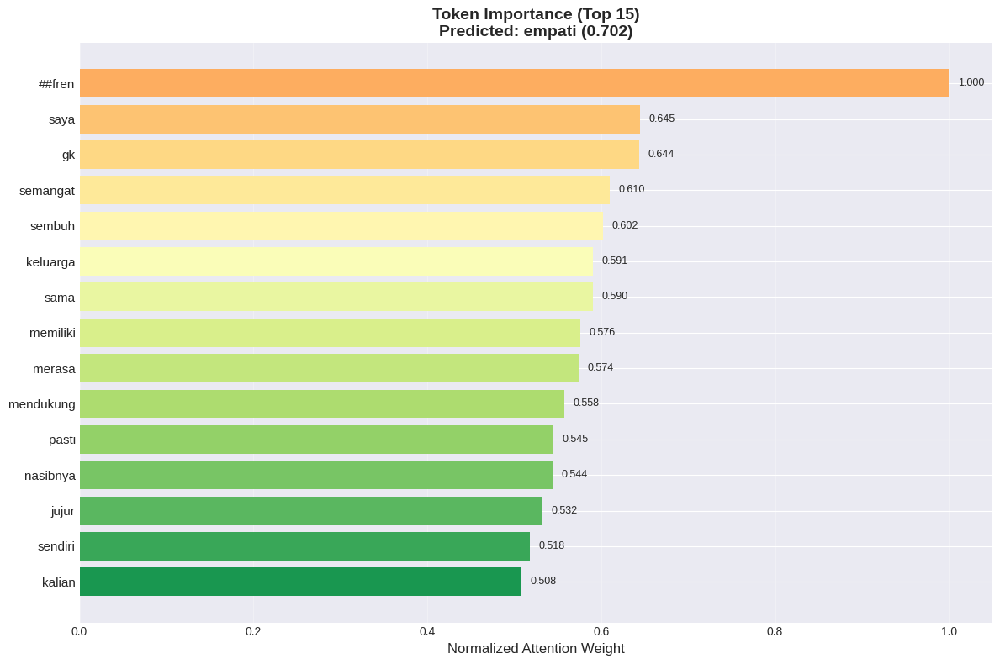

✓ Saved: token_importance_2.png

SECTION 7: COMPREHENSIVE ANALYSIS

COMPREHENSIVE ANALYSIS
Text: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya memang seharusnya, gk sepantasnya, aku bahagia.

PREDICTION:
  Class: sedih
  Confidence: 0.7743

  All probabilities:
    bahagia         0.0179 
    empati          0.0695 ██
    kecewa          0.0983 ██
    netral          0.0315 
    other           0.0085 
    sedih           0.7743 ███████████████████████

──────────────────────────────────────────────────────────────────────
LIME EXPLANATION:
──────────────────────────────────────────────────────────────────────

Explaining: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya meman...
Predicted: sedih (confidence: 0.774)
Computing LIME explanation with 500 samples...

Top 8 contributing features:
--------------------------------------------------
gk                        -0.1669 ███
terbayang                 -0.0799 █
sepantasnya      


──────────────────────────────────────────────────────────────────────
ATTENTION ANALYSIS:
──────────────────────────────────────────────────────────────────────

Token importance: Kamu diberi cobaan itu karna dosa2mu. Kata2 ini selalu terbayang. Jadi, ya meman...


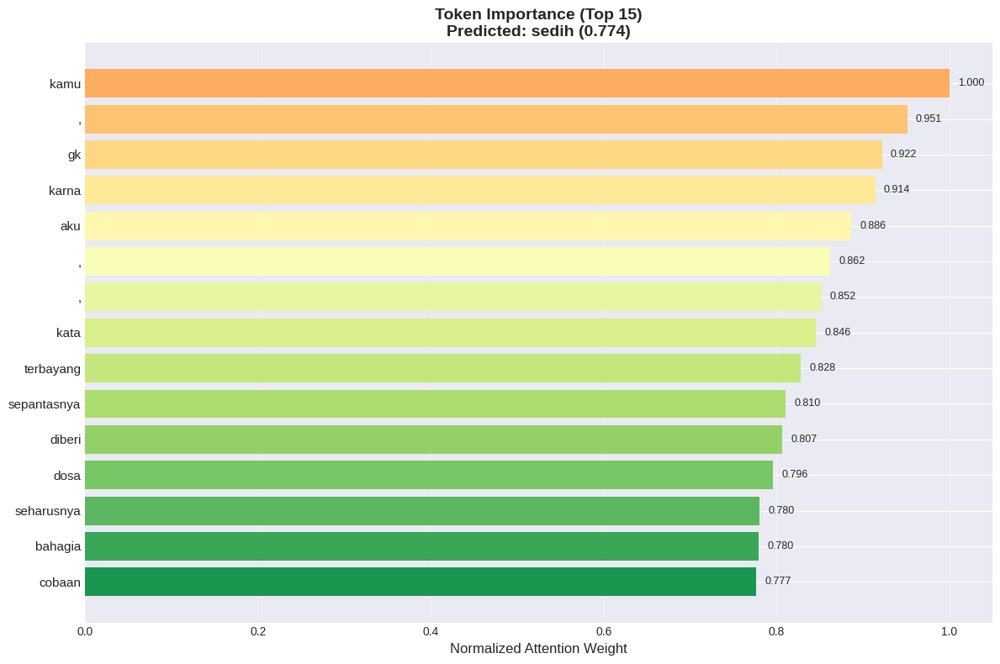

✓ Saved: comprehensive_1_importance.png


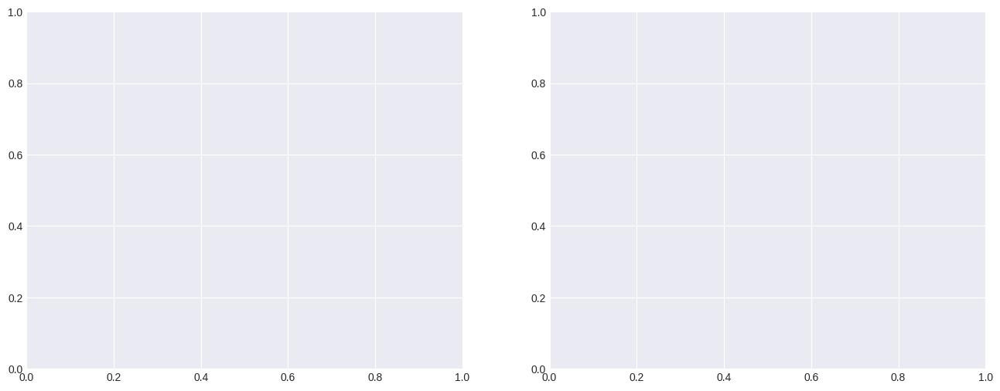

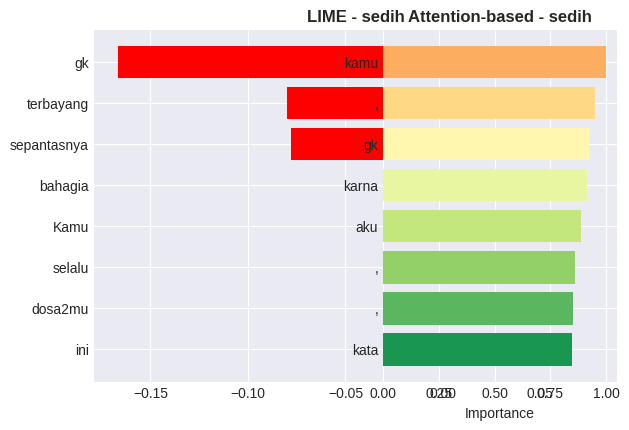


✓ Comparison saved: comprehensive_1_comparison.png

COMPREHENSIVE ANALYSIS
Text: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama nasibnya seperti saya Dan untuk kalian yang masih berjuang semangat ya kalian gk sendiri kok keluarga kalian pasti mendukung kalian untuk sembuh

PREDICTION:
  Class: empati
  Confidence: 0.7018

  All probabilities:
    bahagia         0.1368 ████
    empati          0.7018 █████████████████████
    kecewa          0.0324 
    netral          0.0643 █
    other           0.0127 
    sedih           0.0520 █

──────────────────────────────────────────────────────────────────────
LIME EXPLANATION:
──────────────────────────────────────────────────────────────────────

Explaining: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama n...
Predicted: empati (confidence: 0.702)
Computing LIME explanation with 500 samples...

Top 8 contributing features:
--------------------------------------------------
kal


──────────────────────────────────────────────────────────────────────
ATTENTION ANALYSIS:
──────────────────────────────────────────────────────────────────────

Token importance: Jujur saya yang hampir sembuh dari skizofrenia merasa memiliki orang yang sama n...


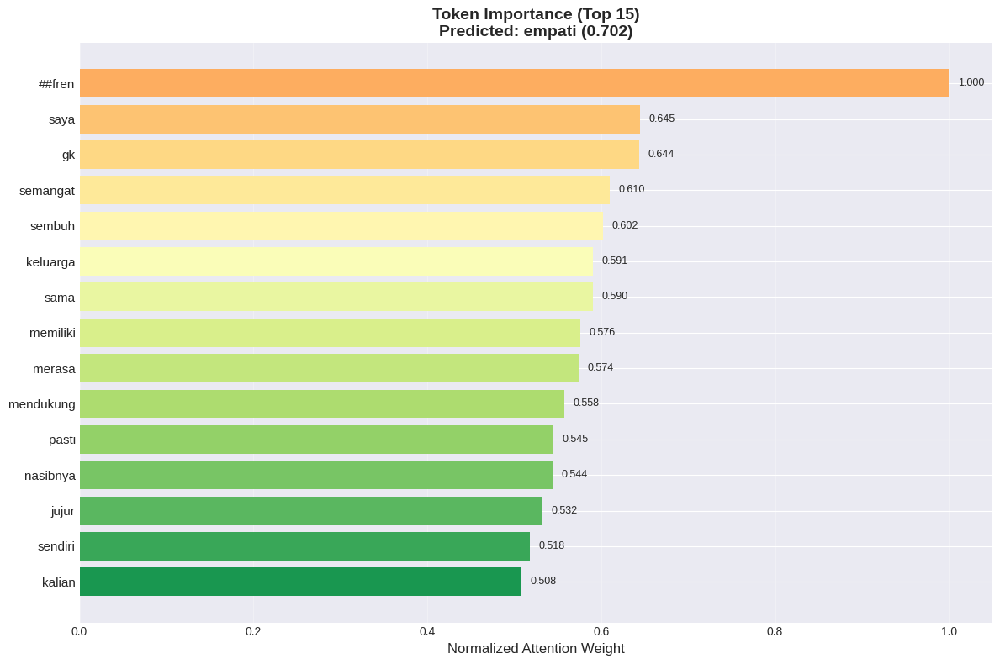

✓ Saved: comprehensive_2_importance.png


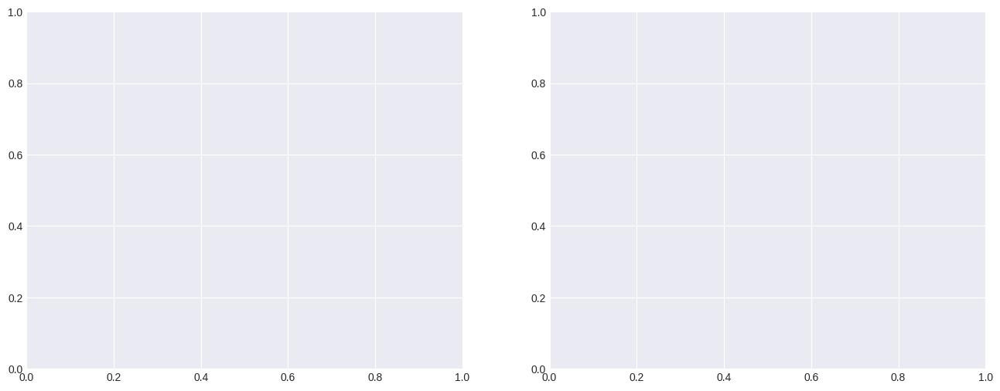

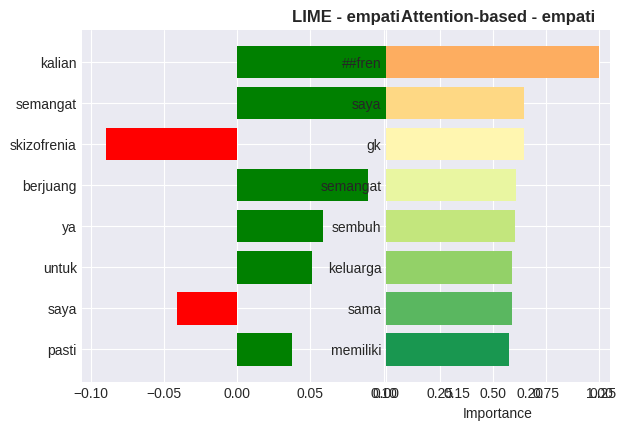


✓ Comparison saved: comprehensive_2_comparison.png

SECTION 8: BATCH ANALYSIS REPORT

Generating batch analysis report...

Batch Analysis Results:
                                                   text_preview true_label predicted confidence correct                                       top_features
                       Pengen banget ikut gabung di chanel ini,     empati    empati      0.270       ✓           banget(+0.06), ini(+0.04), chanel(-0.03)
Schizoid personality disorder?<br>Avoidant personality disor...     netral    netral      0.689       ✓  gejalanya(-0.01), Apakah(-0.01), introvert(+0.01)
Di Keluarga selalu diremehin di masalah percintaan pun gagal...      sedih     sedih      0.773       ✓         masalah(-0.03), ingat(+0.02), gagal(-0.02)
                Anxiety Disorder demi Allah itu nyakitin banget      sedih     sedih      0.464       ✓   nyakitin(-0.08), Disorder(-0.04), Anxiety(-0.04)
Mental udah ancur banget, diagnosa diri sendiri kalo punya m...      sedih   

In [ ]:
# ============================================================
# EXPLAINABLE AI (XAI) - COMPLETE NOTEBOOK
# Untuk Model LoRA + IndoBERT (Klasifikasi Emosi)
# ============================================================

# =========================
# SECTION 1: INSTALL & IMPORT
# =========================
print("Installing required packages...")
!pip install -q transformers datasets accelerate peft torch
!pip install -q lime matplotlib seaborn scikit-learn
!pip install -q openpyxl pandas

print("\n✓ Installation complete!")

import os
import torch
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from peft import PeftModel, PeftConfig
from lime.lime_text import LimeTextExplainer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from IPython.display import display, HTML, Image
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("\n✓ All packages imported!")


# =========================
# SECTION 2: LOAD DATA & MODEL
# =========================
print("\n" + "="*70)
print("SECTION 2: LOADING DATA & MODEL")
print("="*70)

# --- 2.1: Load Dataset ---
print("\n[1/4] Loading dataset...")
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

# Clean data: remove empty or very short texts
print("  Cleaning data...")
train_df['text'] = train_df['text'].astype(str)
test_df['text'] = test_df['text'].astype(str)

# Filter out texts with less than 2 words
train_df = train_df[train_df['text'].apply(lambda x: len(str(x).split()) >= 2)]
test_df = test_df[test_df['text'].apply(lambda x: len(str(x).split()) >= 2)]

# Reset index
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print(f"  Train size: {len(train_df)}")
print(f"  Test size: {len(test_df)}")
print(f"  ✓ Data cleaned (removed texts with < 2 words)")

# --- 2.2: Setup Label Encoder ---
print("\n[2/4] Setting up label encoder...")
le = LabelEncoder()
le.fit(train_df['label'])

print(f"  Emotion classes: {list(le.classes_)}")
print(f"  Number of classes: {len(le.classes_)}")

# --- 2.3: Device Setup ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\n[3/4] Device: {device}")
if torch.cuda.is_available():
    print(f"  GPU: {torch.cuda.get_device_name(0)}")

# --- 2.4: Load Model ---
print("\n[4/4] Loading trained model...")

MODEL_DIR = "indobert-lora-emotion"  # Folder model LoRA Anda
BASE_MODEL = "indobenchmark/indobert-base-p1"

# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained(BASE_MODEL)

# Load base model with attention output enabled
base_model = AutoModelForSequenceClassification.from_pretrained(
    BASE_MODEL,
    num_labels=len(le.classes_),
    output_attentions=True
)

# Load LoRA adapter
model = PeftModel.from_pretrained(base_model, MODEL_DIR)
model.to(device)
model.eval()

print("  ✓ Model loaded successfully!")
print(f"  Model parameters: {sum(p.numel() for p in model.parameters()):,}")


# =========================
# SECTION 3: PREDICTION FUNCTIONS
# =========================
print("\n" + "="*70)
print("SECTION 3: SETTING UP PREDICTION FUNCTIONS")
print("="*70)

def predict_proba(texts, batch_size=16):
    """
    Predict class probabilities for input texts

    Args:
        texts: str or list of str
        batch_size: batch size for processing

    Returns:
        numpy array of shape (n_samples, n_classes)
    """
    if isinstance(texts, str):
        texts = [texts]

    # Ensure all texts are strings
    texts = [str(t) if t else "" for t in texts]

    all_probs = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]

        # Tokenize
        enc = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors="pt"
        )
        enc = {k: v.to(device) for k, v in enc.items()}

        # Predict
        with torch.no_grad():
            outputs = model(**enc)
            probs = F.softmax(outputs.logits, dim=1).cpu().numpy()

        all_probs.append(probs)

    return np.vstack(all_probs)


def predict_single(text):
    """
    Predict single text with detailed output

    Returns:
        dict with prediction details
    """
    probs = predict_proba([text])[0]
    pred_idx = np.argmax(probs)
    pred_class = le.inverse_transform([pred_idx])[0]
    confidence = probs[pred_idx]

    return {
        'text': text,
        'predicted_class': pred_class,
        'confidence': confidence,
        'probabilities': {cls: prob for cls, prob in zip(le.classes_, probs)}
    }


def get_attention_weights(text):
    """
    Get attention weights from model

    Returns:
        attentions, tokens, prediction
    """
    enc = tokenizer(text, padding=True, truncation=True, max_length=128, return_tensors="pt")
    enc = {k: v.to(device) for k, v in enc.items()}

    with torch.no_grad():
        outputs = model(**enc, output_attentions=True)
        probs = F.softmax(outputs.logits, dim=1).cpu().numpy()
        attentions = outputs.attentions

    tokens = tokenizer.convert_ids_to_tokens(enc['input_ids'][0])
    pred_idx = np.argmax(probs[0])
    pred_class = le.inverse_transform([pred_idx])[0]

    return attentions, tokens, pred_class, probs[0]


print("✓ Prediction functions ready!")

# Test prediction
test_text = test_df['text'].iloc[0]
result = predict_single(test_text)
print(f"\nTest prediction:")
print(f"  Text: {test_text[:60]}...")
print(f"  Predicted: {result['predicted_class']} ({result['confidence']:.3f})")


# =========================
# SECTION 4: MODEL EVALUATION
# =========================
print("\n" + "="*70)
print("SECTION 4: MODEL EVALUATION ON TEST SET")
print("="*70)

print("\nEvaluating model on test set...")
y_true = test_df['label'].values
y_pred_probs = predict_proba(test_df['text'].tolist())
y_pred = le.inverse_transform(np.argmax(y_pred_probs, axis=1))

# Classification Report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=le.classes_))

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred, labels=le.classes_)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix - Test Set', fontsize=14, fontweight='bold')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Confusion matrix saved as 'confusion_matrix.png'")


# =========================
# SECTION 5: LIME EXPLAINER
# =========================
print("\n" + "="*70)
print("SECTION 5: LIME (Local Interpretable Model-agnostic Explanations)")
print("="*70)

# Initialize LIME
lime_explainer = LimeTextExplainer(class_names=list(le.classes_))
print("✓ LIME explainer initialized")


def explain_with_lime(text, num_features=10, num_samples=500, save_name="lime"):
    """
    Explain prediction using LIME

    Args:
        text: input text
        num_features: number of features to show
        num_samples: number of samples for LIME
        save_name: filename prefix for saving

    Returns:
        LIME explanation object
    """
    print(f"\nExplaining: {text[:80]}...")

    # Check if text is too short
    word_count = len(str(text).split())
    if word_count < 2:
        print(f"⚠️ Text too short ({word_count} words). Skipping LIME explanation.")
        return None

    # Get prediction
    result = predict_single(text)
    pred_class = result['predicted_class']
    confidence = result['confidence']

    print(f"Predicted: {pred_class} (confidence: {confidence:.3f})")

    try:
        # Generate LIME explanation
        print(f"Computing LIME explanation with {num_samples} samples...")

        # Adjust num_features based on text length
        effective_features = min(num_features, word_count)

        exp = lime_explainer.explain_instance(
            text,
            predict_proba,
            num_features=effective_features,
            num_samples=num_samples
        )

        # Display top features
        print(f"\nTop {effective_features} contributing features:")
        print("-" * 50)
        for word, weight in exp.as_list():
            sign = "+" if weight >= 0 else ""
            bar = "█" * int(abs(weight) * 20)
            print(f"{word:25s} {sign}{weight:7.4f} {bar}")

        # Save HTML version
        exp.save_to_file(f'{save_name}.html')
        print(f"\n✓ Interactive HTML saved: {save_name}.html")

        # Save PNG version
        fig = exp.as_pyplot_figure()
        plt.title(f'LIME Explanation\nPredicted: {pred_class} (conf={confidence:.2f})',
                  fontsize=12, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'{save_name}.png', dpi=150, bbox_inches='tight')
        plt.close()
        print(f"✓ Image saved: {save_name}.png")

        # Display in notebook
        display(HTML(exp.as_html()))

        return exp

    except Exception as e:
        print(f"⚠️ LIME explanation failed: {str(e)}")
        print("This might happen with very short texts or special characters.")
        return None


# --- Example 1: Analyze sample texts ---
print("\n" + "-"*70)
print("EXAMPLE ANALYSES")
print("-"*70)

# Filter out short texts
valid_sample_texts = []
for text in test_df['text'].tolist():
    if isinstance(text, str) and len(text.split()) >= 2:
        valid_sample_texts.append(text)
    if len(valid_sample_texts) >= 3:
        break

# If we don't have enough valid samples, use first available ones
if len(valid_sample_texts) < 3:
    print("⚠️ Warning: Some texts might be too short for LIME analysis")
    sample_texts = [test_df['text'].iloc[0], test_df['text'].iloc[5], test_df['text'].iloc[10]]
else:
    sample_texts = valid_sample_texts[:3]

for i, text in enumerate(sample_texts, 1):
    print(f"\n{'='*70}")
    print(f"LIME EXAMPLE {i}")
    print('='*70)
    result = explain_with_lime(text, num_features=10, save_name=f"lime_example_{i}")
    if result is None:
        print(f"⚠️ Skipped example {i} due to text length issues")


# =========================
# SECTION 6: ATTENTION VISUALIZATION
# =========================
print("\n" + "="*70)
print("SECTION 6: ATTENTION WEIGHT VISUALIZATION")
print("="*70)


def visualize_attention_heatmap(text, layer_idx=-1, head_idx=0, save_name="attention"):
    """
    Visualize attention weights as heatmap

    Args:
        text: input text
        layer_idx: which layer (-1 for last layer)
        head_idx: which attention head
        save_name: filename for saving
    """
    print(f"\nVisualizing attention: {text[:80]}...")

    # Get attention weights
    attentions, tokens, pred_class, probs = get_attention_weights(text)

    # Extract specific layer and head
    attention = attentions[layer_idx][0, head_idx].cpu().numpy()

    # Truncate to actual sequence
    seq_len = min(len(tokens), attention.shape[0])
    attention = attention[:seq_len, :seq_len]
    tokens = tokens[:seq_len]

    # Create heatmap
    fig, ax = plt.subplots(figsize=(14, 12))

    sns.heatmap(
        attention,
        xticklabels=tokens,
        yticklabels=tokens,
        cmap='YlOrRd',
        cbar_kws={'label': 'Attention Weight'},
        square=True,
        linewidths=0.5,
        ax=ax
    )

    layer_name = f"Layer {layer_idx}" if layer_idx >= 0 else "Last Layer"
    plt.title(f'Attention Weights - {layer_name}, Head {head_idx}\n'
              f'Predicted: {pred_class} ({probs[np.argmax(probs)]:.3f})',
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Target Tokens', fontsize=12)
    plt.ylabel('Source Tokens', fontsize=12)
    plt.xticks(rotation=90, fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()

    plt.savefig(f'{save_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✓ Saved: {save_name}.png")

    return attention, tokens


def visualize_token_importance(text, save_name="token_importance"):
    """
    Visualize token importance based on averaged attention

    Args:
        text: input text
        save_name: filename for saving
    """
    print(f"\nToken importance: {text[:80]}...")

    attentions, tokens, pred_class, probs = get_attention_weights(text)

    # Average attention across all layers and heads
    all_attentions = []
    for layer_attention in attentions:
        # Average across heads
        avg_heads = layer_attention[0].mean(dim=0).cpu().numpy()
        all_attentions.append(avg_heads)

    # Average across layers
    avg_attention = np.mean(all_attentions, axis=0)

    # Token importance = average attention received
    token_importance = avg_attention.mean(axis=0)

    # Truncate and filter
    seq_len = min(len(tokens), len(token_importance))
    tokens = tokens[:seq_len]
    token_importance = token_importance[:seq_len]

    # Remove special tokens
    filtered_tokens = []
    filtered_importance = []
    for tok, imp in zip(tokens, token_importance):
        if tok not in ['[CLS]', '[SEP]', '[PAD]']:
            filtered_tokens.append(tok)
            filtered_importance.append(imp)

    # Normalize importance
    filtered_importance = np.array(filtered_importance)
    filtered_importance = filtered_importance / filtered_importance.max()

    # Sort by importance
    sorted_idx = np.argsort(filtered_importance)[::-1]

    # Plot top 15
    top_n = min(15, len(filtered_tokens))
    plot_tokens = [filtered_tokens[i] for i in sorted_idx[:top_n]]
    plot_importance = [filtered_importance[i] for i in sorted_idx[:top_n]]

    fig, ax = plt.subplots(figsize=(12, 8))

    colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(plot_importance)))
    bars = ax.barh(range(len(plot_tokens)), plot_importance, color=colors)

    ax.set_yticks(range(len(plot_tokens)))
    ax.set_yticklabels(plot_tokens, fontsize=11)
    ax.set_xlabel('Normalized Attention Weight', fontsize=12)
    ax.set_title(f'Token Importance (Top {top_n})\n'
                 f'Predicted: {pred_class} ({probs[np.argmax(probs)]:.3f})',
                 fontsize=14, fontweight='bold')
    ax.invert_yaxis()
    ax.grid(axis='x', alpha=0.3)

    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, plot_importance)):
        ax.text(val + 0.01, i, f'{val:.3f}', va='center', fontsize=9)

    plt.tight_layout()
    plt.savefig(f'{save_name}.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"✓ Saved: {save_name}.png")

    return filtered_tokens, filtered_importance


# --- Visualize examples ---
print("\n" + "-"*70)
print("ATTENTION VISUALIZATION EXAMPLES")
print("-"*70)

for i, text in enumerate(sample_texts[:2], 1):
    print(f"\n{'='*70}")
    print(f"ATTENTION EXAMPLE {i}")
    print('='*70)

    visualize_attention_heatmap(text, save_name=f"attention_heatmap_{i}")
    visualize_token_importance(text, save_name=f"token_importance_{i}")


# =========================
# SECTION 7: COMPREHENSIVE ANALYSIS
# =========================
print("\n" + "="*70)
print("SECTION 7: COMPREHENSIVE ANALYSIS")
print("="*70)


def comprehensive_analysis(text, save_prefix="comprehensive"):
    """
    Complete XAI analysis combining LIME + Attention

    Args:
        text: input text
        save_prefix: prefix for saved files
    """
    print(f"\n{'='*70}")
    print("COMPREHENSIVE ANALYSIS")
    print('='*70)
    print(f"Text: {text}")
    print('='*70)

    # 1. Prediction
    result = predict_single(text)
    print(f"\nPREDICTION:")
    print(f"  Class: {result['predicted_class']}")
    print(f"  Confidence: {result['confidence']:.4f}")
    print(f"\n  All probabilities:")
    for cls, prob in result['probabilities'].items():
        bar = "█" * int(prob * 30)
        print(f"    {cls:15s} {prob:.4f} {bar}")

    # 2. LIME
    print(f"\n{'─'*70}")
    print("LIME EXPLANATION:")
    print('─'*70)
    exp_lime = explain_with_lime(text, num_features=8, save_name=f"{save_prefix}_lime")

    # 3. Attention
    print(f"\n{'─'*70}")
    print("ATTENTION ANALYSIS:")
    print('─'*70)
    visualize_token_importance(text, save_name=f"{save_prefix}_importance")

    # 4. Create comparison figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # LIME subplot
    plt.subplot(1, 2, 1)
    exp_lime.as_pyplot_figure()
    plt.title(f"LIME - {result['predicted_class']}", fontsize=12, fontweight='bold')

    # Get attention data
    attentions, tokens, pred_class, probs = get_attention_weights(text)
    all_attentions = []
    for layer_attention in attentions:
        avg_heads = layer_attention[0].mean(dim=0).cpu().numpy()
        all_attentions.append(avg_heads)
    avg_attention = np.mean(all_attentions, axis=0)
    token_importance = avg_attention.mean(axis=0)

    seq_len = min(len(tokens), len(token_importance))
    tokens = tokens[:seq_len]
    token_importance = token_importance[:seq_len]

    filtered_tokens = []
    filtered_importance = []
    for tok, imp in zip(tokens, token_importance):
        if tok not in ['[CLS]', '[SEP]', '[PAD]']:
            filtered_tokens.append(tok)
            filtered_importance.append(imp)

    filtered_importance = np.array(filtered_importance)
    if filtered_importance.max() > 0:
        filtered_importance = filtered_importance / filtered_importance.max()

    sorted_idx = np.argsort(filtered_importance)[::-1][:8]

    # Attention subplot
    plt.subplot(1, 2, 2)
    plot_tokens = [filtered_tokens[i] for i in sorted_idx]
    plot_importance = [filtered_importance[i] for i in sorted_idx]

    colors = plt.cm.RdYlGn(np.linspace(0.3, 0.9, len(plot_importance)))
    plt.barh(range(len(plot_tokens)), plot_importance, color=colors)
    plt.yticks(range(len(plot_tokens)), plot_tokens)
    plt.xlabel('Importance')
    plt.title(f'Attention-based - {pred_class}', fontsize=12, fontweight='bold')
    plt.gca().invert_yaxis()

    plt.tight_layout()
    plt.savefig(f'{save_prefix}_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\n✓ Comparison saved: {save_prefix}_comparison.png")
    print('='*70)


# Run comprehensive analysis
for i, text in enumerate(sample_texts[:2], 1):
    comprehensive_analysis(text, save_prefix=f"comprehensive_{i}")


# =========================
# SECTION 8: BATCH ANALYSIS REPORT
# =========================
print("\n" + "="*70)
print("SECTION 8: BATCH ANALYSIS REPORT")
print("="*70)

print("\nGenerating batch analysis report...")

# Sample random texts from test set
n_samples = 20
sampled_df = test_df.sample(n_samples, random_state=42)

batch_results = []

for idx, row in sampled_df.iterrows():
    text = str(row['text'])
    true_label = row['label']

    # Skip if text is too short (less than 2 words)
    if len(text.split()) < 2:
        print(f"⚠️ Skipping short text: '{text}'")
        continue

    try:
        # Prediction
        result = predict_single(text)
        pred_label = result['predicted_class']
        confidence = result['confidence']

        # LIME top features
        exp = lime_explainer.explain_instance(
            text,
            predict_proba,
            num_features=min(3, len(text.split())),  # Adjust features based on text length
            num_samples=100
        )
        top_features = [f"{w}({v:+.2f})" for w, v in exp.as_list()[:3]]

        batch_results.append({
            'text_preview': text[:60] + "..." if len(text) > 60 else text,
            'true_label': true_label,
            'predicted': pred_label,
            'confidence': f"{confidence:.3f}",
            'correct': '✓' if true_label == pred_label else '✗',
            'top_features': ', '.join(top_features)
        })

    except Exception as e:
        print(f"⚠️ Error processing text: '{text[:50]}...' - {str(e)}")
        # Still add the result but without LIME features
        try:
            result = predict_single(text)
            batch_results.append({
                'text_preview': text[:60] + "..." if len(text) > 60 else text,
                'true_label': true_label,
                'predicted': result['predicted_class'],
                'confidence': f"{result['confidence']:.3f}",
                'correct': '✓' if true_label == result['predicted_class'] else '✗',
                'top_features': 'N/A (text too short)'
            })
        except:
            continue

# Create DataFrame
batch_df = pd.DataFrame(batch_results)

print("\nBatch Analysis Results:")
print("="*70)
print(batch_df.to_string(index=False))

# Save to CSV
batch_df.to_csv("xai_batch_report.csv", index=False)
print(f"\n✓ Report saved: xai_batch_report.csv")

# Statistics
accuracy = (batch_df['correct'] == '✓').sum() / len(batch_df)
print(f"\nBatch Accuracy: {accuracy:.2%}")


# =========================
# SECTION 9: INTERACTIVE FUNCTION
# =========================
print("\n" + "="*70)
print("SECTION 9: INTERACTIVE ANALYSIS FUNCTION")
print("="*70)


def analyze_custom_text(text, method='all'):
    """
    Interactive function to analyze any custom text

    Args:
        text: input text to analyze
        method: 'lime', 'attention', or 'all'
    """
    print("\n" + "="*70)
    print("CUSTOM TEXT ANALYSIS")
    print("="*70)
    print(f"Input: {text}")
    print("="*70)

    if method in ['lime', 'all']:
        print("\n[LIME Analysis]")
        explain_with_lime(text, num_features=10, save_name="custom_lime")

    if method in ['attention', 'all']:
        print("\n[Attention Analysis]")
        visualize_token_importance(text, save_name="custom_attention")

    print("\n✓ Analysis complete!")


print("\n✓ Interactive function ready!")
print("\nExample usage:")
print("  analyze_custom_text('Saya sangat bahagia hari ini!')")
print("  analyze_custom_text('Mengecewakan sekali pelayanannya', method='lime')")


# =========================
# SECTION 10: SUMMARY & FILES
# =========================
print("\n" + "="*70)
print("SECTION 10: SUMMARY")
print("="*70)

print("\n✓ EXPLAINABLE AI ANALYSIS COMPLETED!")
print("\n📁 Generated Files:")a
print("  📊 Evaluation:")
print("    - confusion_matrix.png")
print("  📝 LIME Explanations:")
print("    - lime_example_1.html / .png")
print("    - lime_example_2.html / .png")
print("    - lime_example_3.html / .png")
print("  🔍 Attention Visualizations:")
print("    - attention_heatmap_1.png")
print("    - attention_heatmap_2.png")
print("    - token_importance_1.png")
print("    - token_importance_2.png")
print("  📊 Comprehensive Analysis:")
print("    - comprehensive_1_*.png")
print("    - comprehensive_2_*.png")
print("  📄 Reports:")
print("    - xai_batch_report.csv")

print("\n" + "="*70)
print("Ready for custom analysis! Use: analyze_custom_text('your text here')")
print("="*70)


## VERSI SIMPEL

In [ ]:
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names=list(le.classes_))

sample_text = "Aku merasa sangat sedih akhir-akhir ini dan tidak punya motivasi."

exp = explainer.explain_instance(
    sample_text,
    predict_proba,
    num_features=10
)

exp.show_in_notebook(text=True)


In [ ]:
import shap

masker = shap.maskers.Text(tokenizer)
explainer_shap = shap.Explainer(predict_proba, masker)

sample_text = "Aku merasa sangat sedih akhir-akhir ini dan tidak punya motivasi."

shap_values = explainer_shap([sample_text])
shap.plots.text(shap_values[0])


  0%|          | 0/210 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:33, 33.88s/it]               
